# Object Detection with YOLOv8 (estimated time 20-30 mins)
<br>Last updated on 23/08/2024</br>
    <br>We aim to detect objects consisting of 20 classes: person, bird, cat, dog, horse, sheep, aeroplane, bicycle, boat, bicycle, boat, bus, car, motorbike, train, bottle, chair, dining table, potted plant, sofa, and TV monitor. **Pascal VOC Detection Dataset** (http://host.robots.ox.ac.uk/pascal/VOC/) and **YOLOv8** (https://docs.ultralytics.com/datasets/detect/voc/) are employed for the trial. The code is modified form https://colab.research.google.com/github/ultralytics/ultralytics/blob/main/examples/tutorial.ipynb. <br>

# Setup

Pip install `ultralytics` and [dependencies](https://github.com/ultralytics/ultralytics/blob/main/pyproject.toml) and check software and hardware.

[![PyPI - Version](https://img.shields.io/pypi/v/ultralytics?logo=pypi&logoColor=white)](https://pypi.org/project/ultralytics/) [![
Downloads](https://static.pepy.tech/badge/ultralytics)](https://pepy.tech/project/ultralytics) [![PyPI - Python Version](https://img.shields.io/pypi/pyversions/ultralytics?logo=python&logoColor=gold)](https://pypi.org/project/ultralytics/)

In [1]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.0/112.6 GB disk)


# 1. Check the availability of CUDA (GPU-Nvidia)

In [2]:
! nvidia-smi

Sat Feb  8 13:35:39 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# 2. Predict

YOLOv8 may be used directly in the Command Line Interface (CLI) with a `yolo` command for a variety of tasks and modes and accepts additional arguments, i.e. `imgsz=640`. See a full list of available `yolo` [arguments](https://docs.ultralytics.com/usage/cfg/) and other details in the [YOLOv8 Predict Docs](https://docs.ultralytics.com/modes/train/).


In [8]:
# Run inference on an image with YOLOv8n
# set up device=0 refer to set cuda:0 (GPU)
!yolo predict model=yolov8n.pt source='https://ultralytics.com/images/zidane.jpg' device=0

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

Found https://ultralytics.com/images/zidane.jpg locally at zidane.jpg
image 1/1 /content/zidane.jpg: 384x640 2 persons, 1 tie, 60.0ms
Speed: 12.7ms preprocess, 60.0ms inference, 336.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


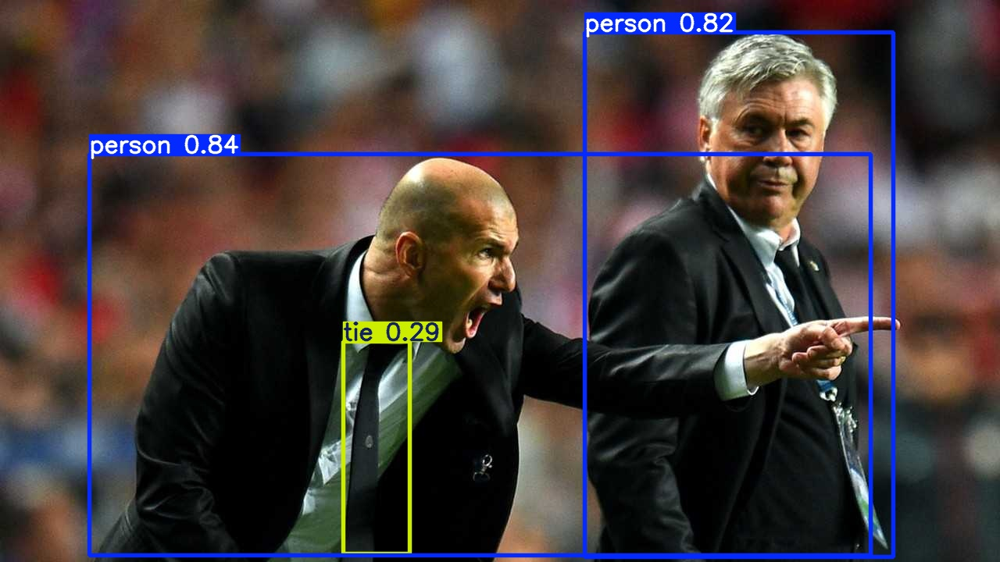

In [9]:
# Imports PIL module
from PIL import Image

# open method used to open different extension image file
im = Image.open("/content/runs/detect/predict/zidane.jpg")

# This method will show image in any image viewer
im

# 3. Train

<p align=""><a href="https://ultralytics.com/hub"><img width="1000" src="https://github.com/ultralytics/assets/raw/main/yolov8/banner-integrations.png"/></a></p>

Train YOLOv8 on [Detect](https://docs.ultralytics.com/tasks/detect/), [Segment](https://docs.ultralytics.com/tasks/segment/), [Classify](https://docs.ultralytics.com/tasks/classify/) and [Pose](https://docs.ultralytics.com/tasks/pose/) datasets. See [YOLOv8 Train Docs](https://docs.ultralytics.com/modes/train/) for more information.




---
Fortunately, ultralytics has hold the dataset on their own way that automatically download when it used. (NO Need dataset and dataloader)

The trained model will save on **/content/runs/train**


In [10]:
!yolo train data=VOC.yaml model=yolov8n.pt epochs=3 imgsz=640 device=0

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=VOC.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=Non

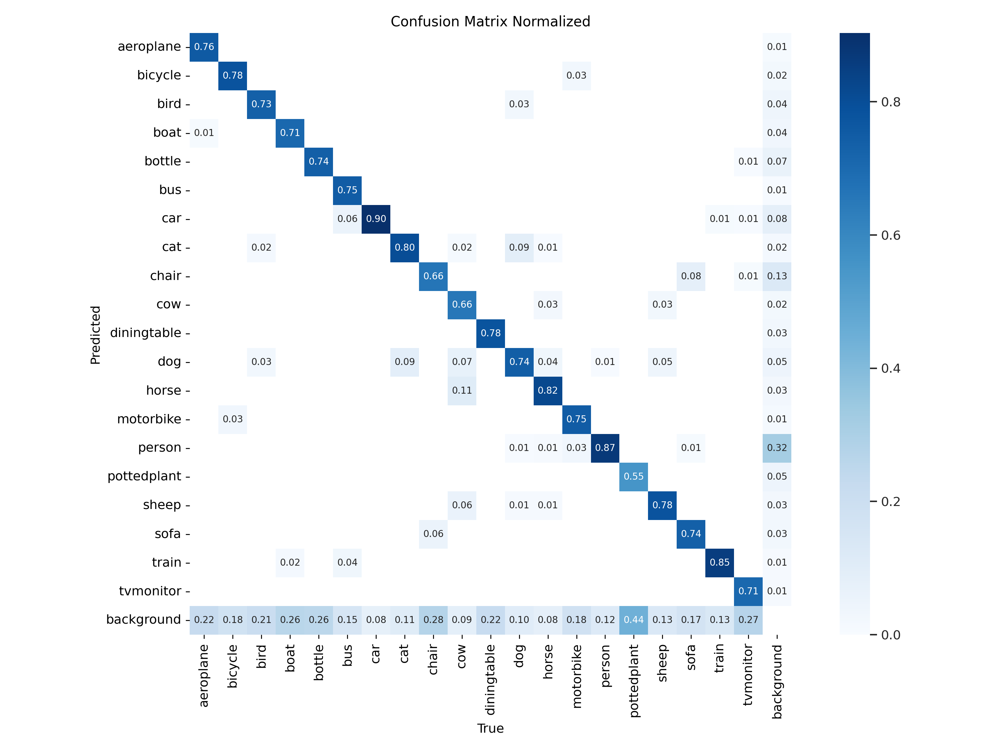

In [19]:
Image.open("runs/detect/train2/confusion_matrix_normalized.png")

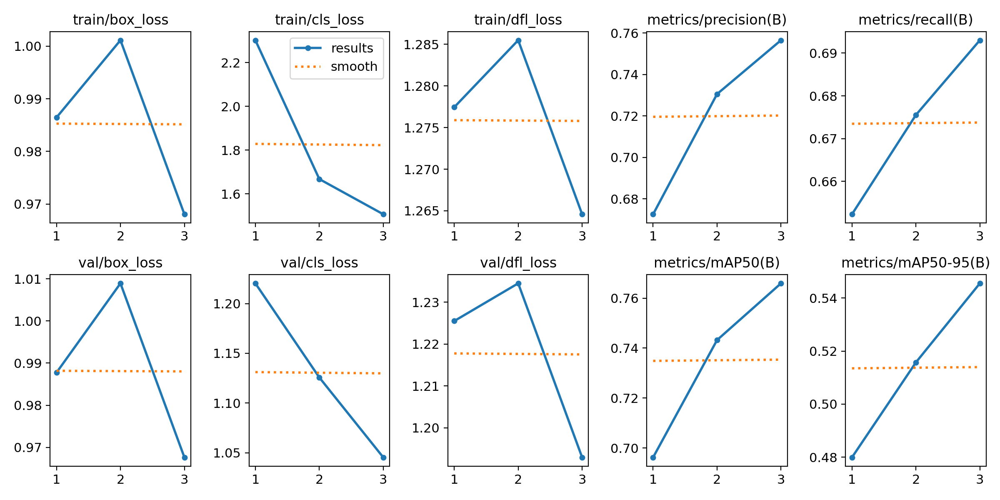

In [20]:
Image.open("runs/detect/train2/results.png")

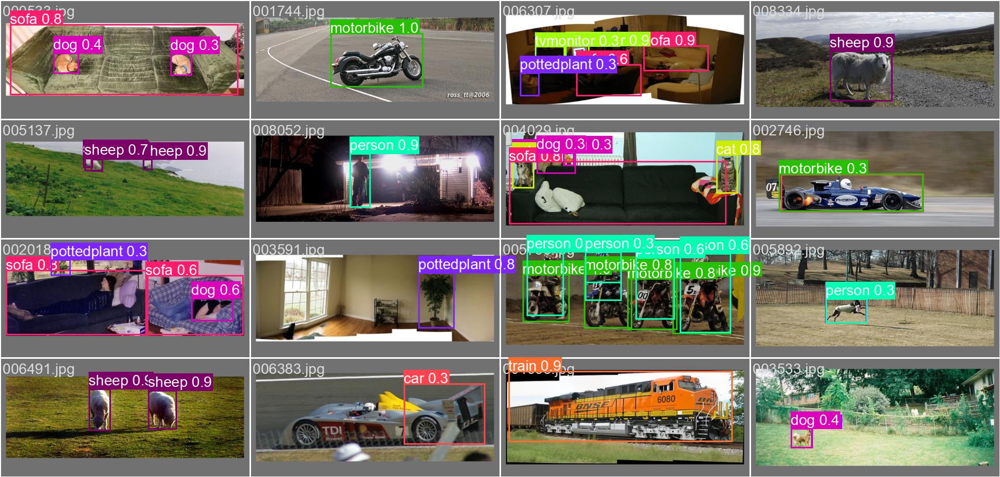

In [23]:
Image.open("runs/detect/train2/val_batch0_pred.jpg")

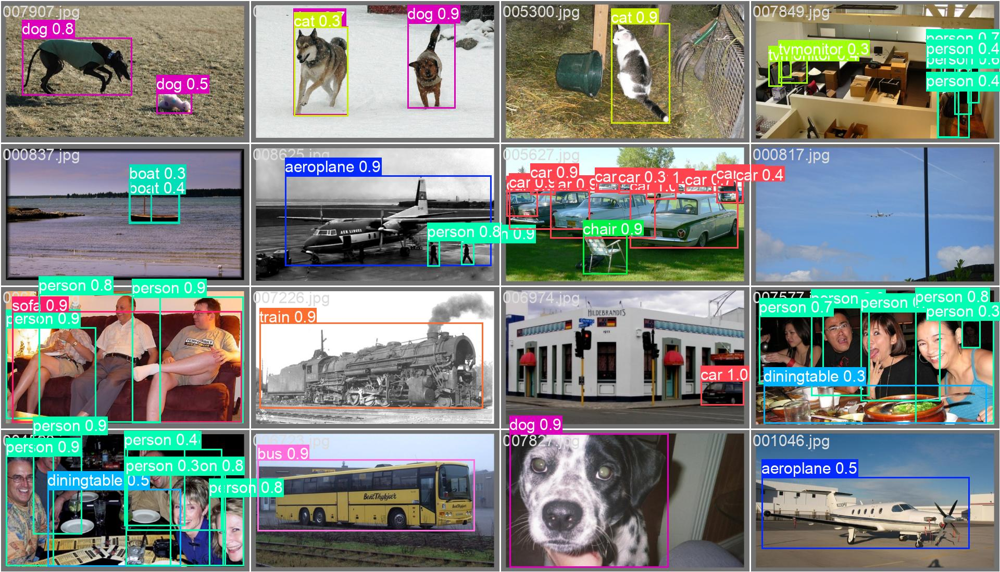

In [24]:
Image.open("runs/detect/train2/val_batch2_pred.jpg")

# 3. Val
Validate a model's accuracy on the Pascal-VOC dataset. The latest YOLOv8 [models](https://github.com/ultralytics/ultralytics#models) are downloaded automatically the first time they are used. See [YOLOv8 Val Docs](https://docs.ultralytics.com/modes/val/) for more information.

In [25]:
# Validate YOLOv8n on VOC val ** the model is pretrained on COCO dataset
!yolo val model=yolov8n.pt data=VOC.yaml device=0

Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
val: Scanning /content/datasets/VOC/labels/test2007.cache... 4952 images, 0 backgrounds, 0 corrupt: 100% 4952/4952 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 310/310 [00:43<00:00,  7.10it/s]
                   all       4952      12032     0.0868      0.085      0.092     0.0742
                person        204        285          0          0   0.000142   8.81e-05
               bicycle        239        337      0.873      0.776      0.879      0.645
                   car        282        459          0          0   0.000196   0.000117
            motorcycle        172        263          0          0   0.000629   0.000404
              airplane        212        469          0          0   6.72e-05   5.38e-05
                   bus        174        

In [26]:
# Validate "Our model" on VOC val
!yolo val model="/content/runs/detect/train/weights/best.pt" data=VOC.yaml device=0

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/cfg/__init__.py", line 957, in entrypoint
    model = YOLO(model, task=task)
            ^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/models/yolo/model.py", line 23, in __init__
    super().__init__(model=model, task=task, verbose=verbose)
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 146, in __init__
    self._load(model, task=task)
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 289, in _load
    self.model, self.ckpt = attempt_load_one_weight(weights)
                            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py", line 900, in attempt_load_one_weight
    ckpt, weight = torch_safe_load(weight)  # load ckpt
     

# 5. Python Usage

YOLOv8 was reimagined using Python-first principles for the most seamless Python YOLO experience yet. YOLOv8 models can be loaded from a trained checkpoint or created from scratch. Then methods are used to train, val, predict, and export the model. See detailed Python usage examples in the [YOLOv8 Python Docs](https://docs.ultralytics.com/usage/python/).

In [27]:
from ultralytics import YOLO

# Load a model
# model = YOLO('yolov8n.yaml')  # build a new model from scratch
model = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)
model.to('cuda:0') # set up the model to GPU
# Use the model
results = model.train(data='VOC.yaml', epochs=3)  # train the model
results = model.val()  # evaluate model performance on the validation set

engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=VOC.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False

train: Scanning /content/datasets/VOC/labels/train2007.cache... 16551 images, 0 backgrounds, 0 corrupt: 100%|██████████| 16551/16551 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/VOC/labels/test2007.cache... 4952 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4952/4952 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      2.25G     0.9865      2.303      1.277         43        640: 100%|██████████| 1035/1035 [05:35<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:42<00:00,  3.63it/s]


                   all       4952      12032      0.673      0.652      0.696       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3      2.36G      1.001      1.667      1.285         48        640: 100%|██████████| 1035/1035 [05:29<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:40<00:00,  3.82it/s]


                   all       4952      12032      0.731      0.676      0.743      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      2.36G     0.9681      1.507      1.265         58        640: 100%|██████████| 1035/1035 [05:28<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:41<00:00,  3.74it/s]


                   all       4952      12032      0.757      0.693      0.766      0.546

3 epochs completed in 0.313 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.73 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,009,548 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:46<00:00,  3.30it/s]


                   all       4952      12032      0.757      0.692      0.766      0.545
             aeroplane        204        285      0.923      0.642      0.829      0.591
               bicycle        239        337      0.861      0.736      0.854      0.604
                  bird        282        459      0.761      0.673      0.761      0.509
                  boat        172        263      0.632      0.548      0.612      0.382
                bottle        212        469      0.642      0.691      0.694       0.47
                   bus        174        213      0.883      0.673      0.853      0.707
                   car        721       1201      0.793       0.85      0.889      0.676
                   cat        322        358       0.78      0.785      0.815      0.602
                 chair        417        756      0.568       0.55      0.568      0.376
                   cow        127        244      0.773      0.699      0.787      0.583
           diningtabl

val: Scanning /content/datasets/VOC/labels/test2007.cache... 4952 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4952/4952 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 310/310 [00:49<00:00,  6.26it/s]


                   all       4952      12032      0.755      0.694      0.766      0.546
             aeroplane        204        285      0.922      0.642      0.826       0.59
               bicycle        239        337      0.855      0.737      0.852      0.604
                  bird        282        459      0.755      0.671       0.76      0.508
                  boat        172        263      0.629       0.56      0.612      0.383
                bottle        212        469      0.639      0.691      0.693      0.469
                   bus        174        213      0.889      0.679      0.853      0.706
                   car        721       1201      0.794      0.852       0.89      0.677
                   cat        322        358      0.782      0.788       0.81      0.598
                 chair        417        756      0.561      0.549      0.567      0.375
                   cow        127        244      0.767      0.701      0.787      0.584
           diningtabl

## Performance on 3 Epochs trained model

In [28]:
results = model.predict(source='/content/datasets/VOC/images/test2007/000014.jpg')
results


image 1/1 /content/datasets/VOC/images/test2007/000014.jpg: 448x640 4 cars, 39.6ms
Speed: 2.7ms preprocess, 39.6ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'aeroplane', 1: 'bicycle', 2: 'bird', 3: 'boat', 4: 'bottle', 5: 'bus', 6: 'car', 7: 'cat', 8: 'chair', 9: 'cow', 10: 'diningtable', 11: 'dog', 12: 'horse', 13: 'motorbike', 14: 'person', 15: 'pottedplant', 16: 'sheep', 17: 'sofa', 18: 'train', 19: 'tvmonitor'}
 obb: None
 orig_img: array([[[140,  79, 145],
         [141,  80, 144],
         [139,  74, 136],
         ...,
         [239, 226, 240],
         [254, 241, 255],
         [245, 232, 246]],
 
        [[ 84,  24,  85],
         [ 75,  15,  75],
         [ 77,  13,  72],
         ...,
         [251, 235, 252],
         [255, 242, 255],
         [248, 232, 249]],
 
        [[ 71,  11,  65],
         [ 73,  14,  65],
         [ 70,  11,  61],
         ...,
         [255, 237, 255],
         [255, 235, 255],
         [246, 224, 248]],
 
        ...,
 
        [[ 26,  36, 100],
     

In [29]:
results[0].boxes.xyxy

tensor([[1.8143e+02, 1.9505e+02, 4.9959e+02, 3.1519e+02],
        [4.1118e+02, 1.7836e+02, 4.9998e+02, 2.1931e+02],
        [2.2182e-01, 1.9345e+02, 7.8279e+01, 2.3519e+02],
        [8.4928e+01, 1.0343e+02, 1.1611e+02, 1.3924e+02]], device='cuda:0')

In [30]:
x0,y0,x1,y1 = results[0].boxes.xyxy[0].cpu().numpy().astype(int)
x0,y0,x1,y1

(181, 195, 499, 315)

In [31]:
results[0].boxes.conf

tensor([0.9206, 0.7736, 0.3637, 0.3223], device='cuda:0')

In [32]:
results[0].boxes.cls

tensor([6., 6., 6., 6.], device='cuda:0')

In [33]:
results[0].names

{0: 'aeroplane',
 1: 'bicycle',
 2: 'bird',
 3: 'boat',
 4: 'bottle',
 5: 'bus',
 6: 'car',
 7: 'cat',
 8: 'chair',
 9: 'cow',
 10: 'diningtable',
 11: 'dog',
 12: 'horse',
 13: 'motorbike',
 14: 'person',
 15: 'pottedplant',
 16: 'sheep',
 17: 'sofa',
 18: 'train',
 19: 'tvmonitor'}

In [34]:
from matplotlib import pyplot as plt
import cv2

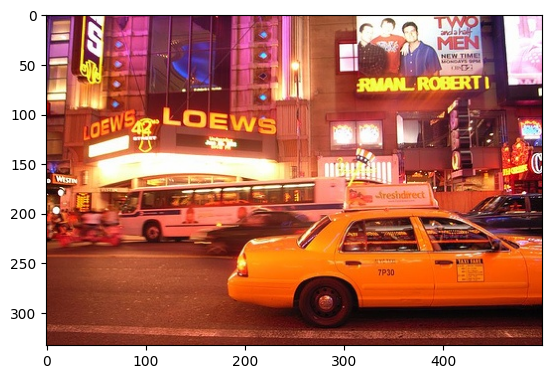

In [35]:
img = results[0].orig_img[:, :, ::-1]
plt.imshow(img)

In [36]:
img.shape

(333, 500, 3)

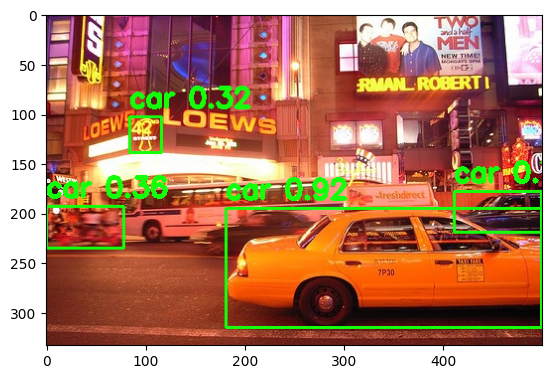

In [37]:
conf = results[0].boxes.conf.cpu().numpy()
cls = results[0].boxes.cls.cpu().numpy()
image = img.copy()
for i in range(len(results[0].boxes)):
  x0,y0,x1,y1 = results[0].boxes.xyxy[i].cpu().numpy().astype(int)
  image = cv2.rectangle(image, (x0, y0), (x1, y1), (20,255,12), 2)
  cv2.putText(image, f"{results[0].names[cls[i]]} {conf[i]:.2f}", (x0, y0-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (20,255,12), 3)
  plt.imshow(image)

# For more details on [How to Train YOLOv8 Object Detection on a Custom Dataset with Roboflow(annotations tool)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov8-object-detection-on-custom-dataset.ipynb)
 and guide by https://www.ultralytics.com/blog/training-custom-datasets-with-ultralytics-yolov8-in-google-colab
